In [1]:
# import numpy as np

# # !/usr/bin/env python3
# # -*- coding: utf-8 -*-
# """
# Created on 20181219

# @author: zhangji

# Trajection of a ellipse, Jeffery equation. 
# """

# %pylab inline
# pylab.rcParams['figure.figsize'] = (25, 11)
# fontsize = 40

# import numpy as np
# import scipy as sp
# from scipy.optimize import leastsq, curve_fit
# from scipy import interpolate
# from scipy.interpolate import interp1d
# from scipy.io import loadmat, savemat
# # import scipy.misc

# import matplotlib
# from matplotlib import pyplot as plt
# from matplotlib import animation, rc
# import matplotlib.ticker as mtick
# from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
# from mpl_toolkits.mplot3d import Axes3D, axes3d

# from sympy import symbols, simplify, series, exp
# from sympy.matrices import Matrix
# from sympy.solvers import solve

# from IPython.display import display, HTML
# from tqdm import tqdm_notebook as tqdm
# import pandas as pd
# import re
# from scanf import scanf
# import os
# import glob

# from codeStore import support_fun as spf
# from src.support_class import *
# from src import stokes_flow as sf

# rc('animation', html='html5')
# PWD = os.getcwd()
# font = {'size': 20}
# matplotlib.rc('font', **font)
# np.set_printoptions(linewidth=90, precision=5)

from tqdm import tqdm_notebook
import os
import glob
import natsort 
import numpy as np
import scipy as sp
from scipy.optimize import leastsq, curve_fit
from scipy import interpolate, integrate
from scipy import spatial, signal
# from scipy.interpolate import interp1d
from scipy.io import loadmat, savemat
# import scipy.misc
import importlib
from IPython.display import display, HTML
import pandas as pd
import pickle
import re
from scanf import scanf

import matplotlib
from matplotlib import pyplot as plt
import matplotlib.colors as colors
from matplotlib import animation, rc
import matplotlib.ticker as mtick
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
from mpl_toolkits.mplot3d import Axes3D, axes3d
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from mpl_toolkits.mplot3d.art3d import Line3DCollection
from matplotlib import cm

from tqdm import tqdm, tqdm_notebook
from time import time
from src.support_class import *
from src import jeffery_model as jm
from codeStore import support_fun as spf
from codeStore import support_fun_table as spf_tb
# %matplotlib notebook

rc('animation', html='html5')
fontsize = 40
PWD = os.getcwd()

/home/zhangji/stokes_flow_master/codeStore/support_fun_table.py:12: UserWarning: matplotlib.pyplot as already been imported, this call will have no effect.
  matplotlib.use('agg')


In [2]:
def load_table_date_pickle(job_dir, theta, phi):
    t_headle = 'th%5.3f_ph%5.3f_(.*?).pickle' % (theta, phi)
    t_path = os.listdir(os.path.join(PWD, job_dir))
    filename = [filename for filename in os.listdir(os.path.join(PWD, job_dir)) 
                if re.match(t_headle, filename) is not None][0]
    with open(os.path.join(PWD, job_dir, filename), 'rb') as handle:
        tpick = pickle.load(handle)
    if 'Table_dt' not in tpick.keys():
        Table_dt = np.hstack((np.diff(Table_t), 0))
        tpick['Table_dt'] = Table_dt
    return tpick, filename

def show_results(axs, tt, tX, job_dir, theta, phi):
    markevery = tt.size // 30
    for axi, ty, marker in zip(axs.flatten(), tX.T, spf_tb.markerstyle_list):
        axi.plot(tt, ty, label=job_dir, marker=marker, markevery=markevery, ms=fontsize * 0.5)
    for axi, ylabel in zip(axs.flatten(), ('center_X', 'center_Y', 'center_Z')):
        plt.sca(axi)
        axi.set_ylabel(ylabel, fontsize=fontsize * 0.7)
        axi.set_xlabel('t', fontsize=fontsize * 0.7)
        plt.xticks(fontsize=fontsize * 0.7)
        plt.yticks(fontsize=fontsize * 0.7)
        axi.legend(fontsize=fontsize * 0.7)
    axs[0].set_title('theta=%5.3f, phi=%5.3f' % (theta, phi), fontsize=fontsize * 0.7)
    plt.tight_layout()

In [30]:
fileHandle = 'ShearJefferyProblem'
job_name = 'eq_theta3.045_phi2.105'
talpha = 3
eval_dt = 0.001
max_iter = 100
ellipse_velocity = 0
planeShearRate = (1, 0, 0)
tnorm = np.array((1, 0, 0))
tcenter = np.array((0, 0, 0))
lateral_norm = np.random.sample(3)
lateral_norm = lateral_norm / np.linalg.norm(lateral_norm)
lateral_norm = lateral_norm - tnorm / np.linalg.norm(tnorm) * np.dot(tnorm, lateral_norm) / np.linalg.norm(lateral_norm)
lateral_norm = lateral_norm / np.linalg.norm(lateral_norm)

ellipse_kwargs = {'name':     job_name,
                  'center':   tcenter,
                  'norm':     tnorm / np.linalg.norm(tnorm),
                  'lateral_norm':  lateral_norm / np.linalg.norm(lateral_norm),
                  'speed':    ellipse_velocity,
                  'lbd':      (talpha ** 2 - 1) / (talpha ** 2 + 1)}
ellipse_obj = jm.JefferyObj(**ellipse_kwargs)
problem = jm.ShearJefferyProblem(planeShearRate=planeShearRate)
problem.add_obj(ellipse_obj)

# evaluation loop
t0 = time()
for idx in range(1, max_iter + 1):
    problem.update_location(eval_dt, print_handle='%d / %d' % (idx, max_iter))
t1 = time()
print('%s: run %d loops using %f' % (fileHandle, max_iter, (t1 - t0)))
jeffery_t = np.arange(max_iter) * eval_dt + eval_dt
center_hist = np.vstack(ellipse_obj.center_hist)
U_hist = np.vstack(ellipse_obj.U_hist)
norm_hist = np.vstack(ellipse_obj.norm_hist)


ShearJefferyProblem: run 100 loops using 0.021085


/home/zhangji/stokes_flow_master/codeStore/support_fun_table.py:17: UserWarning: matplotlib.pyplot as already been imported, this call will have no effect.
  matplotlib.use('agg')


-ini_theta 0.000000 -ini_phi 0.000000 -ini_psi 0.000000


True

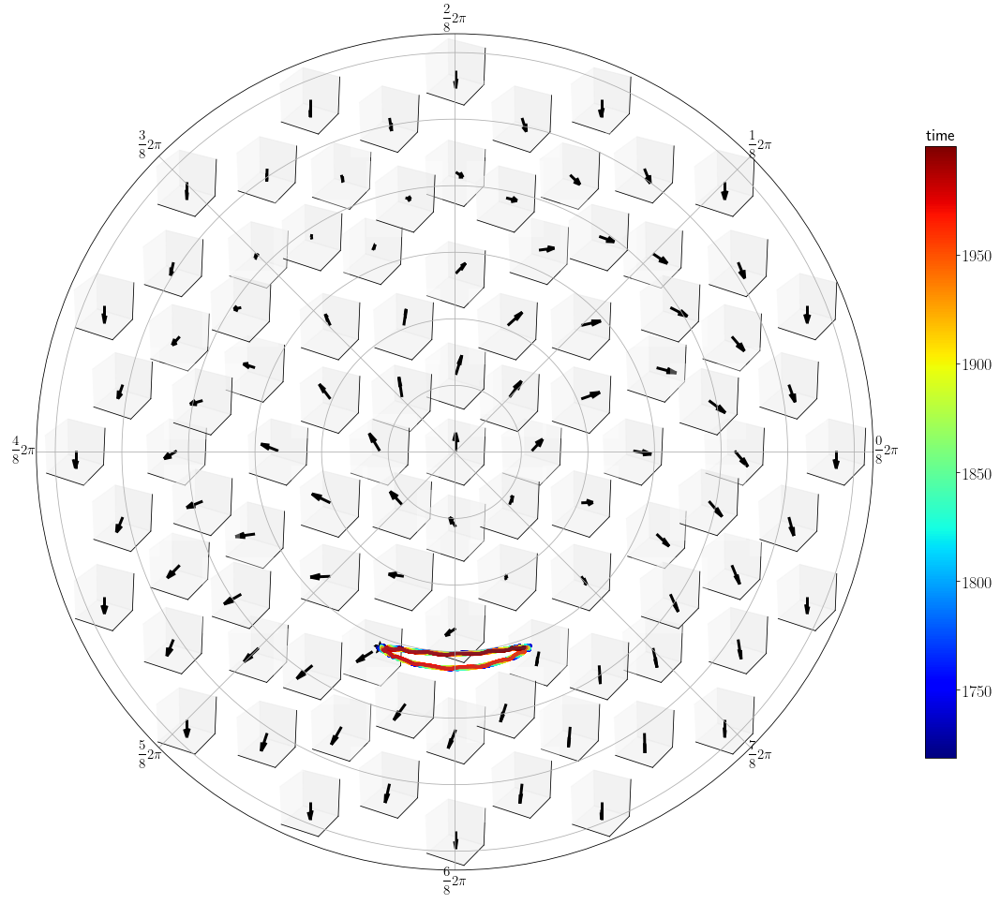

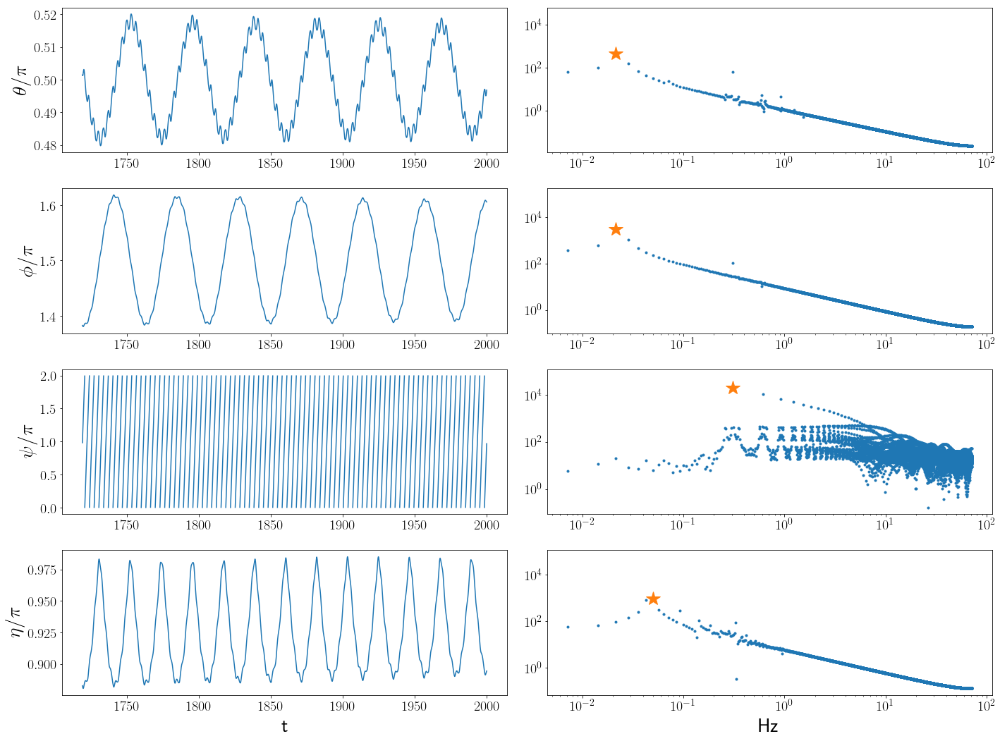

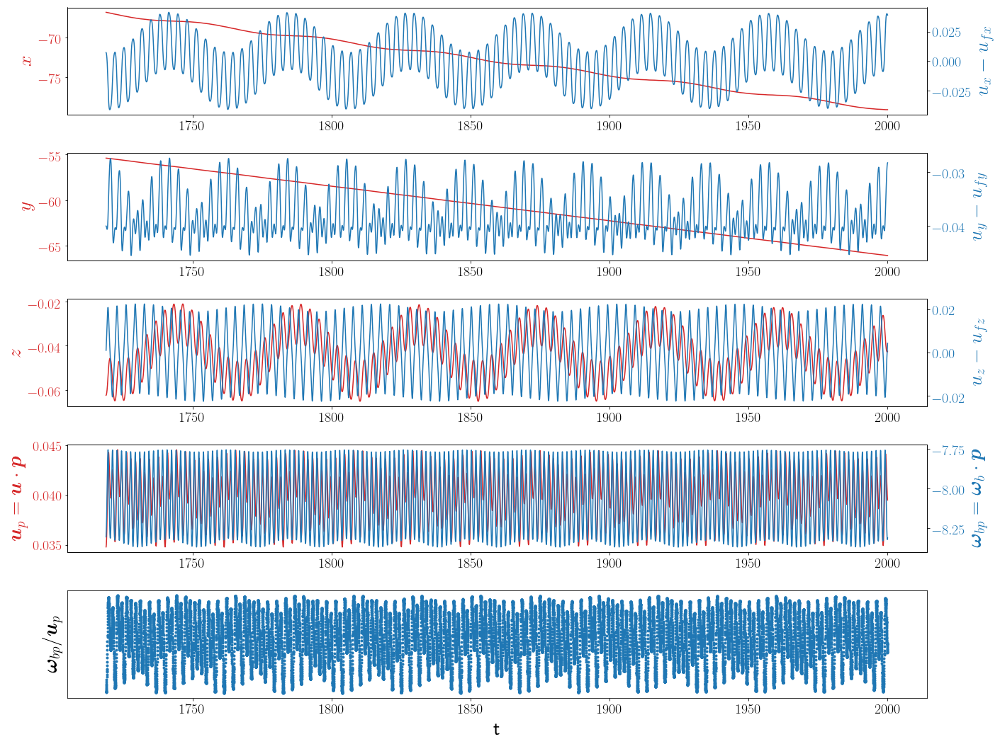

In [63]:
importlib.reload(spf_tb)

job_dir = 'hlxC01_a_psi-0e'
table_name = 'hlxC01_tau1a'
theta, phi = 0.410, 2.807
# theta, phi = 0.683, 2.807
# theta, phi = 0.683, 6.016
# theta, phi = 0.956, 5.882
# theta, phi = 1.503, 0.267
# theta, phi = 1.503, 4.144
# theta, phi = 1.912, 0.267
# theta, phi = 3.142, 3.476

job_dir = 'ecoC01B05_T10_psi-0a'
theta, phi = 0, 0
# theta, phi = 0.137, 0.668
# theta, phi = 0.820, 6.150
# theta, phi = 0.956, 4.946
# theta, phi = 1.093, 1.203



t_headle = 'th%5.3f_ph%5.3f_(.*?).pickle' % (theta, phi)
t_path = os.listdir(os.path.join(PWD, job_dir))
filename = [filename for filename in os.listdir(os.path.join(PWD, job_dir)) 
            if re.match(t_headle, filename) is not None][0]
with open(os.path.join(PWD, job_dir, filename), 'rb') as handle:
    tpick = pickle.load(handle)
for var_name in tpick.keys():
    texp = '%s = tpick[\'%s\']' % (var_name, var_name)
    exec(texp)
if 'Table_dt' not in tpick.keys():
    Table_dt = np.hstack((np.diff(Table_t), 0))
# print(tpick['Table_theta'][0], tpick['Table_phi'][0], tpick['Table_psi'][0])
print('-ini_theta %f -ini_phi %f -ini_psi %f' % 
      (tpick['Table_theta'][0], tpick['Table_phi'][0], tpick['Table_psi'][0]))

idx = Table_t > 0
freq_pk = spf_tb.get_major_fre(Table_t[idx], Table_theta[idx])
idx = Table_t > Table_t.max() - 1 / freq_pk * 6
# spf_tb.show_table_result(Table_t[idx], Table_dt[idx], Table_X[idx], Table_P[idx], Table_P2[idx], 
#                          Table_theta[idx], Table_phi[idx], Table_psi[idx], Table_eta[idx], save_every)
spf_tb.show_theta_phi(Table_t[idx], Table_dt[idx], Table_X[idx], Table_P[idx], Table_P2[idx], 
                      Table_theta[idx], Table_phi[idx], Table_psi[idx], Table_eta[idx])
spf_tb.show_theta_phi_psi_eta(Table_t[idx], Table_dt[idx], Table_X[idx], Table_P[idx], Table_P2[idx], 
                              Table_theta[idx], Table_phi[idx], Table_psi[idx], Table_eta[idx])
spf_tb.show_center_X(Table_t[idx], Table_dt[idx], Table_X[idx], Table_P[idx], Table_P2[idx], 
                     Table_theta[idx], Table_phi[idx], Table_psi[idx], Table_eta[idx], 
                     table_name=table_name)

0.40977300000000016 2.807381 0.0
0.40977300000000016 2.807381 0.0


True

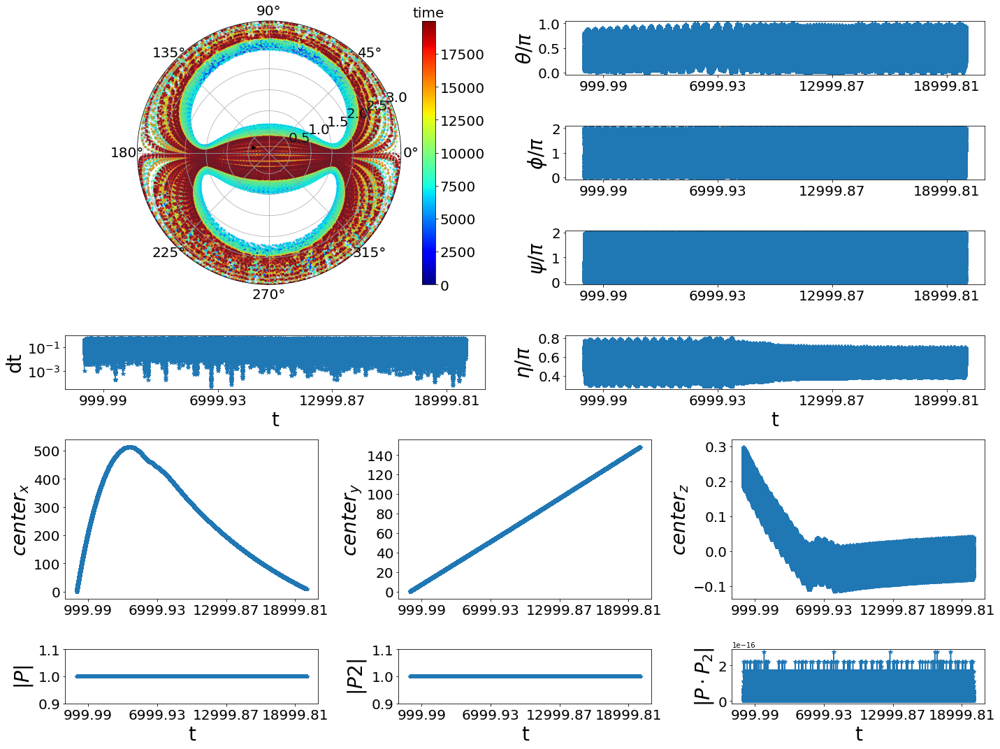

In [28]:
idx = Table_t < 20000
print(tpick['Table_theta'][0], tpick['Table_phi'][0], tpick['Table_psi'][0])
print(tpick['Table_theta'][idx][0], tpick['Table_phi'][idx][0], tpick['Table_psi'][idx][0])
spf_tb.show_table_result(Table_t[idx], Table_dt[idx], Table_X[idx], Table_P[idx], Table_P2[idx], 
                         Table_theta[idx], Table_phi[idx], Table_psi[idx], Table_eta[idx], save_every)

/home/zhangji/stokes_flow_master/codeStore/support_fun_table.py:12: UserWarning: matplotlib.pyplot as already been imported, this call will have no effect.
  matplotlib.use('agg')


th0.571_ph2.356_ps0.000_D20190703_T050318.pickle
0.571199 2.356194 0.0
tmin=1466.550256 1.5216745902168543 5.821921199274399 4.689631391629186


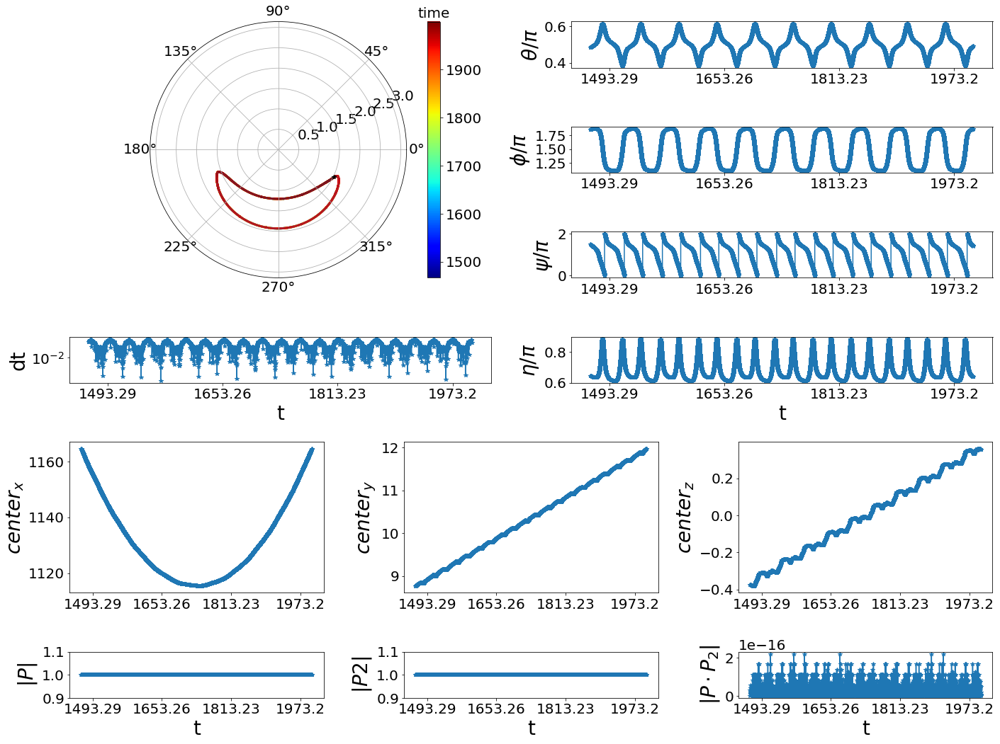

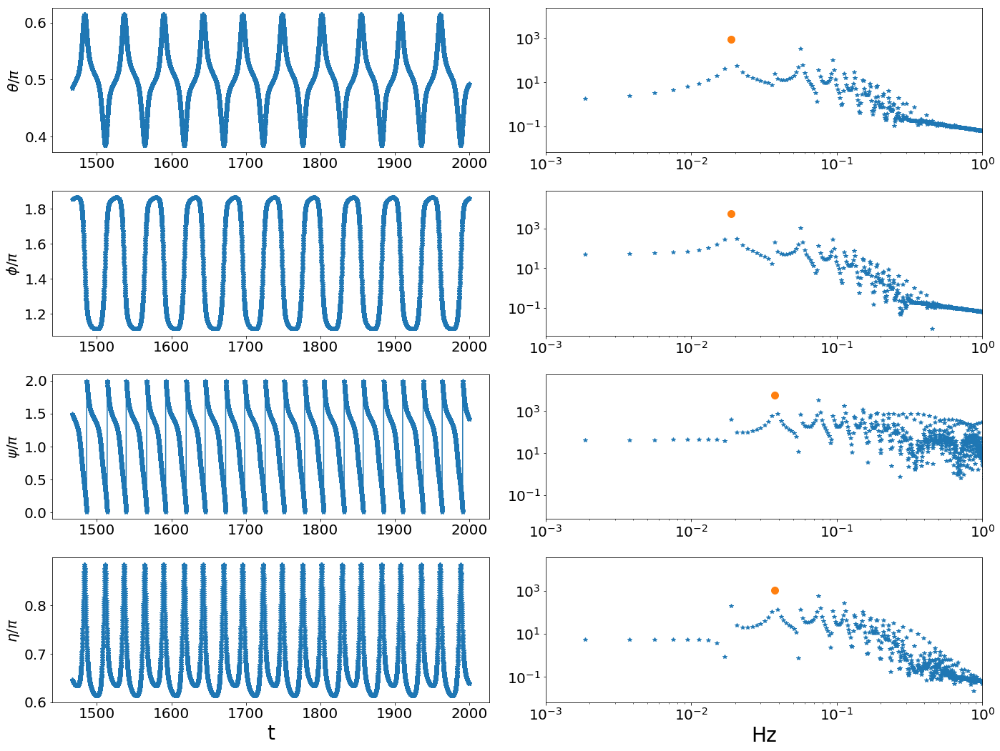

In [19]:
importlib.reload(spf_tb)

# job_dir = 'hlxC01_a_psi-0b'
# # theta, phi = 0.000, 1.705
# # theta, phi = 0.349, 3.536
# # theta, phi = 0.349, 2.778
# # theta, phi = 0.349, 6.125
# # theta, phi = 0.349, 6.188
# # theta, phi = 1.745, 0.316
# # theta, phi = 1.745, 0.505
# # theta, phi = 1.745, 3.410
# # theta, phi = 2.094, 0.442
# # theta, phi = 3.142, 3.473
# theta, phi = 3.142, 3.221

# job_dir = 'hlxC01_a_psi-0b'
# theta, phi = 3.142, 3.536
# theta, phi = 3.142, 3.473
# theta, phi = 3.142, 3.410
# theta, phi = 3.142, 3.221
# theta, phi = 3.142, 3.157
# theta, phi = 3.142, 3.094

# job_dir = 'hlxC01_a_psi-0d'
# theta, phi = 3.142, 0.214
# theta, phi = 3.142, 0.214

# job_dir = 'hlxC01_a_psi-0c'
# theta, phi = 0.349, 6.220

job_dir = 'ecoC01B05_passive_psi-0c'
theta, phi = 0.000, 0.000
theta, phi = 3.142, 4.451
theta, phi = 0.143, 0.000
theta, phi = 0.571, 2.356
# theta, phi = 1.571, 1.309

tpick, fileName = spf_tb.load_table_date_pickle(job_dir, theta, phi)
print(fileName)
for var_name in tpick.keys():
    texp = '%s = tpick[\'%s\']' % (var_name, var_name)
    exec(texp)
idx = Table_t > -1
print(tpick['Table_theta'][idx][0], tpick['Table_phi'][idx][0], tpick['Table_psi'][idx][0])
# spf_tb.show_table_result(Table_t[idx], Table_dt[idx], Table_X[idx], Table_P[idx], Table_P2[idx], 
#                          Table_theta[idx], Table_phi[idx], Table_psi[idx], Table_eta[idx], save_every)
# idx = Table_t > 9000
# print(tpick['Table_theta'][idx][0], tpick['Table_phi'][idx][0], tpick['Table_psi'][idx][0])

# find major frequrence
tmin_list = []
for ty in (tpick['Table_theta'] / np.pi, tpick['Table_phi'] / np.pi, 
           tpick['Table_psi'] / np.pi, tpick['Table_eta'] / np.pi):
    tx = tpick['Table_t']
    idx = np.hstack((True, np.diff(tx)>0))
    tx = tx[idx]
    ty = ty[idx]
    t_use = np.linspace(tx.min(), tx.max(), tx.size)
    ty1 = spf_tb.get_continue_angle(tx, ty, t_use)
    tfft = np.fft.rfft(ty1)
    tfft_abs = np.abs(tfft)
    tfreq = np.fft.rfftfreq(t_use.size, np.mean(np.diff(t_use)))
    tpk = signal.find_peaks(tfft_abs)[0]
    fft_abs_pk = tfft_abs[tpk]
    freq_pk = tfreq[tpk]
    tidx = np.argsort(fft_abs_pk)[-1]
    tmin = tx.max() - 1 / freq_pk[tidx] * 20
    tmin_list.append(tmin)
tmin = np.max(tmin_list)
# # dbg
# print('dbg')
# tmin = 8998
idx = Table_t > tmin
print('tmin=%f' % tmin, tpick['Table_theta'][idx][0], tpick['Table_phi'][idx][0], tpick['Table_psi'][idx][0])
spf_tb.show_table_result(Table_t[idx], Table_dt[idx], Table_X[idx], Table_P[idx], Table_P2[idx], 
                         Table_theta[idx], Table_phi[idx], Table_psi[idx], Table_eta[idx], save_every, 
                         resampling=False, resampling_fct=2)

# show results
fig = plt.figure(figsize=(20, 15))
fig.patch.set_facecolor('white')
axs = fig.subplots(nrows=4, ncols=2)
for (ax0, ax1), ty, ylab in zip(axs, 
                                (tpick['Table_theta'], tpick['Table_phi'], 
                                 tpick['Table_psi'], tpick['Table_eta']), 
                                ('$\\theta / \pi$', '$\\phi / \pi$', 
                                 '$\\psi / \pi$', '$\\eta / \pi$')):
    # ignore last steps and resampling
    tx = tpick['Table_t']
    idx = np.logical_and(np.hstack((True, np.diff(tx)>0)), tx > tmin)
    tx = tx[idx]
    ty = ty[idx]
    t_use = np.linspace(tx.min(), tx.max(), tx.size)
    ty1 = spf_tb.get_continue_angle(tx, ty, t_use)
    # find major frequrence and display
    tfft = np.fft.rfft(ty1)
    tfft_abs = np.abs(tfft)
    tfreq = np.fft.rfftfreq(t_use.size, np.mean(np.diff(t_use)))
    
    ax0.plot(t_use, ty1 / np.pi, '*-')
    ax0.set_ylabel(ylab)
    ax1.loglog(tfreq, tfft_abs, '*')
    tpk = signal.find_peaks(tfft_abs)[0]
    fft_abs_pk = tfft_abs[tpk]
    freq_pk = tfreq[tpk]
    tidx = np.argsort(fft_abs_pk)[-1]
    ax1.loglog(freq_pk[tidx], fft_abs_pk[tidx], '.', ms=fontsize * 0.5)
    ax1.set_xlim(1e-3, 1e0)
axs[-1, 0].set_xlabel('t', size=fontsize * 0.7)
axs[-1, 1].set_xlabel('Hz', size=fontsize * 0.7)
plt.tight_layout()


In [11]:
tpk[0]

array([  10,   20,   30, ..., 4230, 4234, 4240])

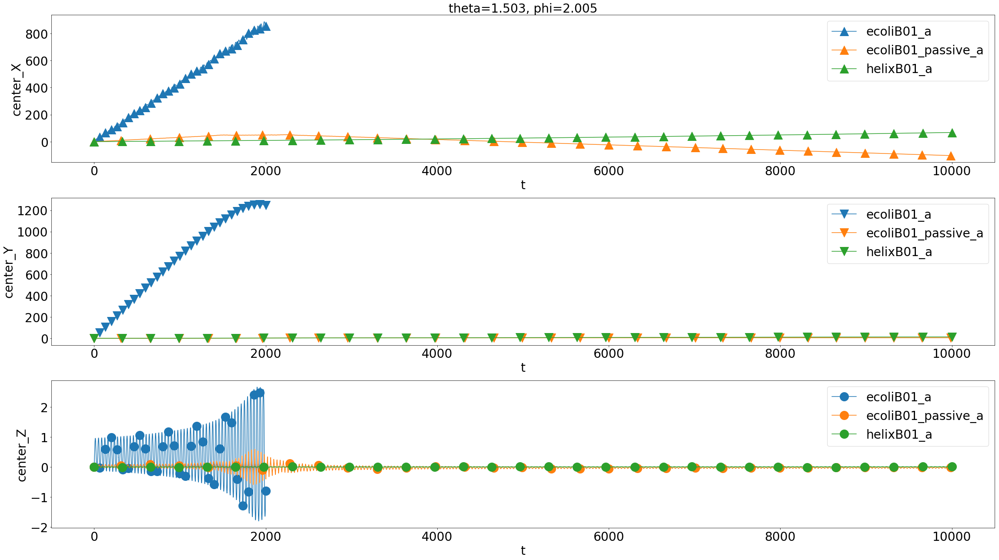

In [34]:
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(32, 18))
fig.patch.set_facecolor('white')
theta, phi = 0, 0.134
theta, phi = 1.503, 2.005

job_dir = 'ecoliB01_a'
tpick = load_date(job_dir, theta, phi)
show_results(axs, tpick['Table_t'], tpick['Table_X'], job_dir, theta, phi)
job_dir = 'ecoliB01_passive_a'
tpick = load_date(job_dir, theta, phi)
show_results(axs, tpick['Table_t'], tpick['Table_X'], job_dir, theta, phi)
job_dir = 'helixB01_a'
tpick = load_date(job_dir, theta, phi)
show_results(axs, tpick['Table_t'], tpick['Table_X'], job_dir, theta, phi)

In [24]:
np.max((0, tx.max() - 1000))

999.7776686023747

/home/zhangji/stokes_flow_master/codeStore/support_fun_table.py:12: UserWarning: matplotlib.pyplot as already been imported, this call will have no effect.
  matplotlib.use('agg')


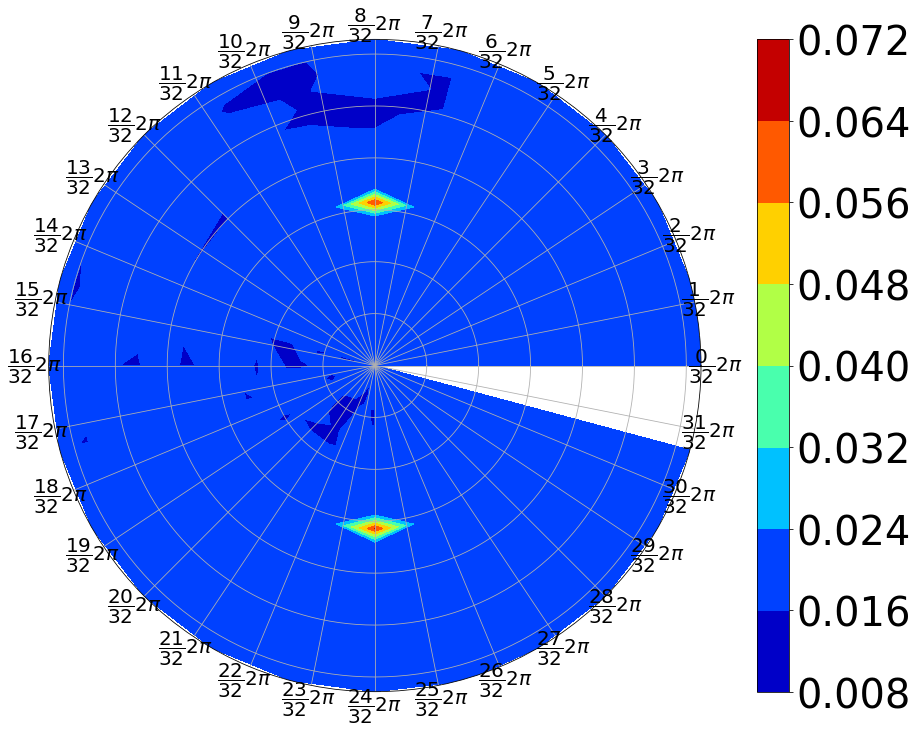

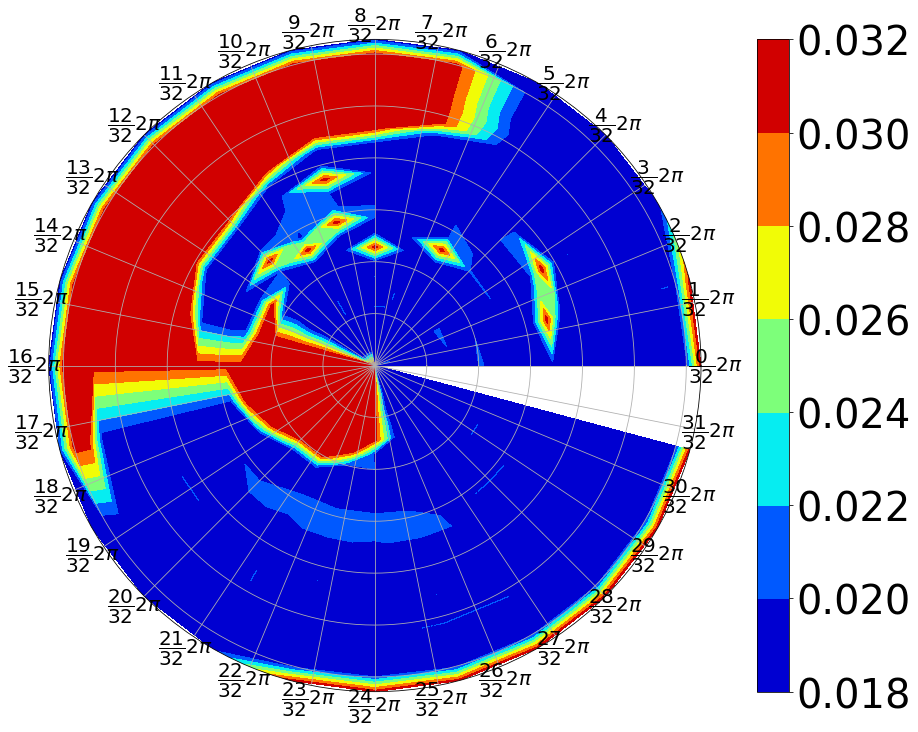

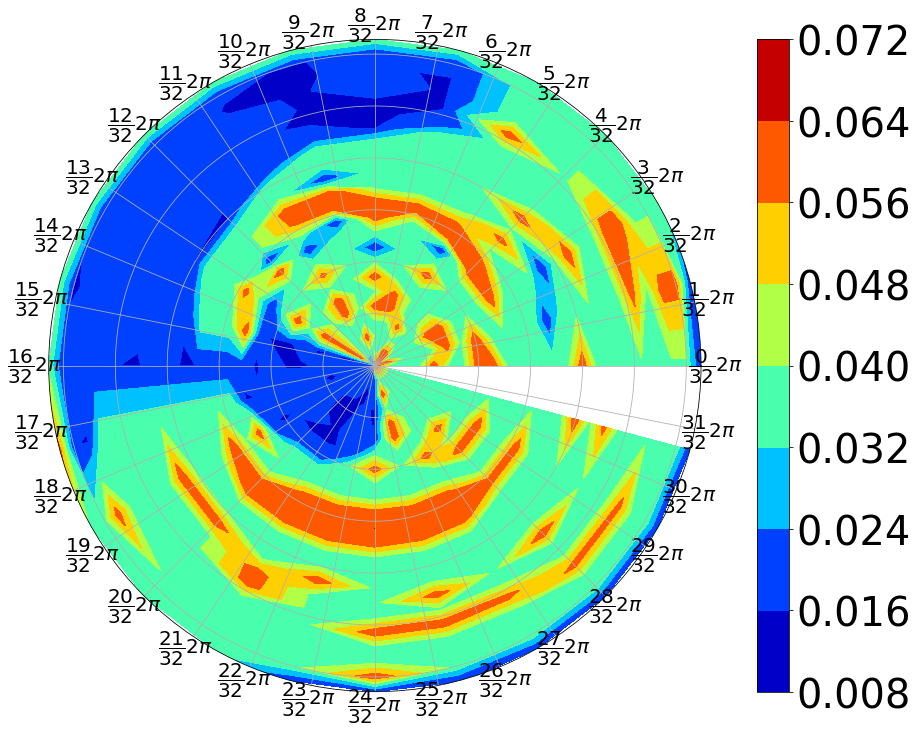

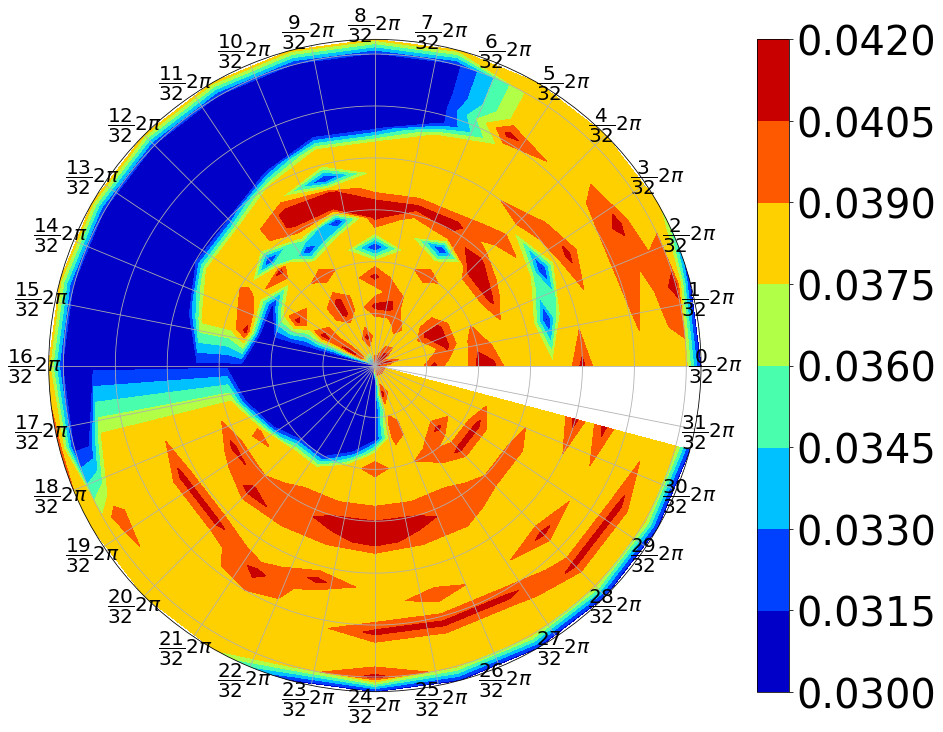

In [26]:
# show phase map of theta-phi
importlib.reload(spf_tb)
job_dir = 'hlxC01_a_psi-0b'
job_dir = 'ecoC01B05_passive_psi-0c'

t_headle = '(.*?).pickle'
t_path = os.listdir(os.path.join(PWD, job_dir))
filename_list = [filename for filename in os.listdir(os.path.join(PWD, job_dir)) 
                 if re.match(t_headle, filename) is not None]
ini_theta_list = []
ini_phi_list = []
lst_eta_list = []
loc_type_list = []
theta_max_fre_list = []
phi_max_fre_list = []
psi_max_fre_list = []
eta_max_fre_list = []
for tname in tqdm_notebook(filename_list):
    with open(os.path.join(PWD, job_dir, tname), 'rb') as handle:
        tpick = pickle.load(handle)
    ini_theta_list.append(tpick['ini_theta'])
    ini_phi_list.append(tpick['ini_phi'])
    lst_eta_list.append(tpick['Table_eta'][-1])
    
    # man made rule
    loc_type = 1
    lst_theta = tpick['Table_theta'][-1]
    lst_phi = tpick['Table_phi'][-1]
    lst_psi = tpick['Table_psi'][-1]
    lst_eta = tpick['Table_eta'][-1]
    if np.isclose(lst_eta, 0.5*np.pi, rtol=0, atol=0.001*np.pi):
        loc_type = 2
    elif lst_eta < 0.5*np.pi and lst_eta > 0.4*np.pi and lst_theta < 1.1*np.pi: 
        loc_type = 3
    loc_type_list.append(loc_type)

    # fft rule
    tx = tpick['Table_t']
    t1 = np.max((0, tx.max() - 1000))
    idx = tx > t1
    theta_max_fre_list.append(spf_tb.get_major_fre(tx[idx], tpick['Table_theta'][idx]))
    phi_max_fre_list.append(spf_tb.get_major_fre(tx[idx], tpick['Table_phi'][idx]))
    psi_max_fre_list.append(spf_tb.get_major_fre(tx[idx], tpick['Table_psi'][idx]))
    eta_max_fre_list.append(spf_tb.get_major_fre(tx[idx], tpick['Table_eta'][idx]))
    
data = pd.DataFrame({'ini_theta': ini_theta_list, 
                    'ini_phi': ini_phi_list, 
                    'lst_eta': lst_eta_list, 
                    'loc_type': loc_type_list, 
                    'theta_max_fre': theta_max_fre_list, 
                    'phi_max_fre': phi_max_fre_list, 
                    'psi_max_fre': psi_max_fre_list, 
                    'eta_max_fre': eta_max_fre_list, 
                    }).pivot_table(index=['ini_theta'], columns=['ini_phi'])
lst_eta = data.lst_eta
loc_type = data.loc_type
theta_max_fre = data.theta_max_fre
phi_max_fre = data.phi_max_fre
psi_max_fre = data.psi_max_fre
eta_max_fre = data.eta_max_fre

def show_phase_map(tuse):
    fig = plt.figure(figsize=(20, 12))
    fig.patch.set_facecolor('white')
    ax0 = fig.add_subplot(111, polar=True)
    n_xticks = 32
    xticks = np.arange(n_xticks)
    ax0.set_xticks(xticks / n_xticks * 2 * np.pi)
    ax0.set_xticklabels(['$\dfrac{%d}{%d}2\pi$' % (i0, n_xticks) for i0 in xticks])
    ax0.set_yticklabels([])
    ax0.set_ylim(0, np.pi)
    im = ax0.contourf(tuse.columns.values, tuse.index.values, tuse.values, 
                      cmap=plt.get_cmap('jet'))
    fig.colorbar(im, ax=ax0, orientation='vertical').ax.tick_params(labelsize=fontsize)

show_phase_map(theta_max_fre)
show_phase_map(phi_max_fre)
show_phase_map(psi_max_fre)
show_phase_map(eta_max_fre)

In [32]:
with pd.option_context('display.max_rows', 1000, 'display.max_columns', 1000):
    display(data.theta_max_fre.T)
# data.theta_max_fre[np.isclose(data.theta_max_fre, 0.052499, rtol=0, atol=0.000001)].T
# data.theta_max_fre.values[np.isclose(data.theta_max_fre, 0.052499, rtol=0, atol=0.000001)]

ini_theta,0.0,0.1428,0.285599,0.428399,0.571199,0.713998,0.856798,0.999598,1.142397,1.285197,1.427997,1.570796,1.713596,1.856396,1.999195,2.141995,2.284795,2.427594,2.570394,2.713194,2.855993,2.998793,3.141593
ini_phi,,,,,,,,,,,,,,,,,,,,,,,
0.000000,0.020000,0.019001,0.019000,0.019000,0.020000,0.019000,0.019003,0.020000,0.020000,0.019001,0.019003,0.019000,0.019003,0.019000,0.020000,0.019000,0.018999,0.019000,0.019000,0.019000,0.019001,0.018999,0.016000
0.261799,0.020000,0.020000,0.019000,0.019003,0.019000,0.020001,0.019001,0.020000,0.019001,0.019000,0.019000,0.019000,0.016000,0.019000,0.019000,0.019001,0.018999,0.019002,0.020000,0.019001,0.020000,0.020000,0.016000
0.523599,0.020001,0.019000,0.019000,0.019000,0.020000,0.020000,0.019000,0.019001,0.019000,0.020001,0.019000,0.019001,0.019000,0.016001,0.019000,0.020001,0.019000,0.019001,0.020000,0.020000,0.019002,0.019002,0.019001
0.785398,0.020000,0.020000,0.019000,0.019000,0.019000,0.018999,0.018999,0.019000,0.019000,0.020000,0.020000,0.019000,0.020000,0.019000,0.020000,0.019001,0.019000,0.019001,0.019001,0.019002,0.019001,0.019002,0.018999
1.047198,0.020000,0.020000,0.019000,0.020000,0.019000,0.019003,0.019003,0.020000,0.019000,0.016002,0.020001,0.020000,0.019000,0.019001,0.019000,0.019000,0.019000,0.018999,0.020000,0.018999,0.019001,0.019000,0.019000
1.308997,0.020001,0.019000,0.019000,0.019000,0.020000,0.020000,0.019000,0.019000,0.018999,0.019000,0.019000,0.020000,0.019000,0.019000,0.019001,0.019000,0.019000,0.016001,0.016000,0.015999,0.016000,0.016002,0.019000
1.570796,0.020000,0.019000,0.019001,0.019000,0.020001,0.018999,0.020000,0.019000,0.016001,0.018999,0.020001,0.063999,0.019000,0.019000,0.019002,0.018999,0.016000,0.015999,0.016000,0.016002,0.016000,0.016002,0.019000
1.832596,0.016001,0.019000,0.020000,0.018999,0.019001,0.019000,0.019000,0.019001,0.019000,0.019001,0.016000,0.020000,0.020000,0.015999,0.019002,0.019000,0.016002,0.016000,0.016000,0.016000,0.016000,0.016000,0.019003
2.094395,0.016004,0.019000,0.019002,0.019000,0.020000,0.020001,0.019002,0.020000,0.019000,0.015999,0.018999,0.020000,0.020000,0.019000,0.019002,0.016001,0.016000,0.016001,0.016002,0.016001,0.016000,0.016001,0.019002


In [61]:
show_idx_list.shape

(292,)

th0.143_ph0.000, Fth=0.019001
th2.142_ph0.000, Fth=0.019000
th0.857_ph0.262, Fth=0.019001
th2.713_ph0.262, Fth=0.019001
th1.999_ph0.524, Fth=0.019000
th0.857_ph0.785, Fth=0.018999
th2.856_ph0.785, Fth=0.019001
th1.999_ph1.047, Fth=0.019000
th0.428_ph1.309, Fth=0.019000
th2.285_ph1.309, Fth=0.019000
th1.999_ph1.571, Fth=0.019002
th1.285_ph1.833, Fth=0.019001
th1.856_ph2.094, Fth=0.019000
th1.142_ph2.356, Fth=0.019000
th1.856_ph2.618, Fth=0.018999
th1.856_ph3.403, Fth=0.019000
th1.999_ph3.665, Fth=0.019000
th1.856_ph3.927, Fth=0.019000
th1.285_ph4.189, Fth=0.018999
th1.142_ph4.451, Fth=0.019000
th0.857_ph4.712, Fth=0.019000


/home/zhangji/anaconda3/lib/python3.5/site-packages/matplotlib/pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


th0.143_ph4.974, Fth=0.019002
th2.713_ph4.974, Fth=0.019000
th1.285_ph5.236, Fth=0.019000
th0.286_ph5.498, Fth=0.019000
th2.142_ph5.498, Fth=0.019000
th0.857_ph5.760, Fth=0.019000
th2.570_ph5.760, Fth=0.019001
th1.142_ph6.021, Fth=0.019000
th2.856_ph6.021, Fth=0.019001


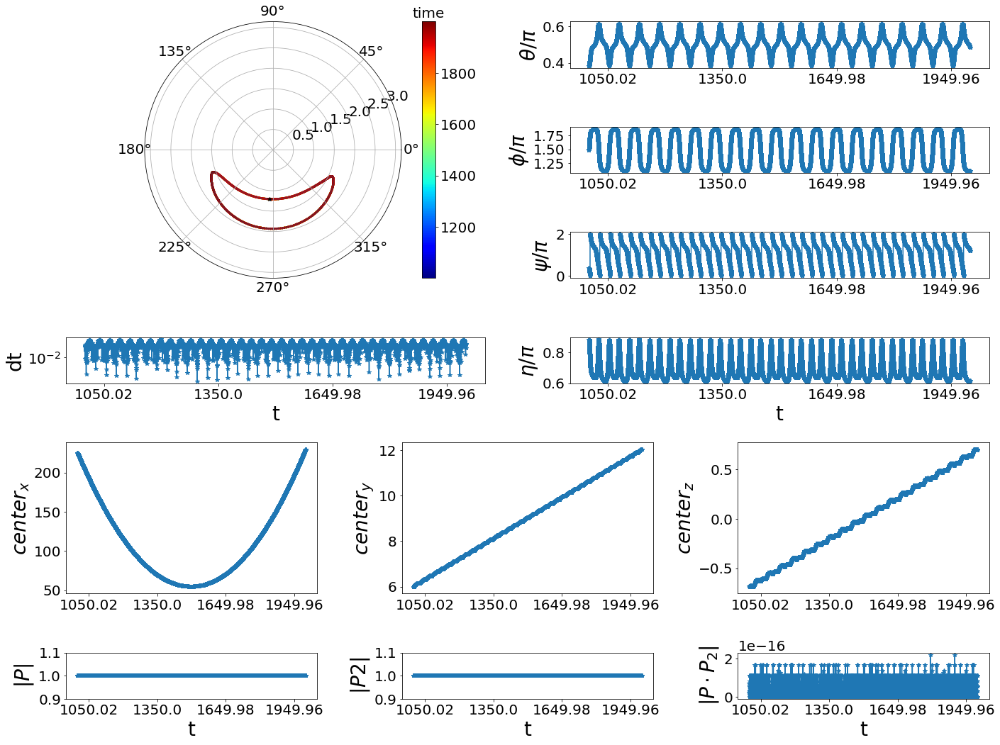

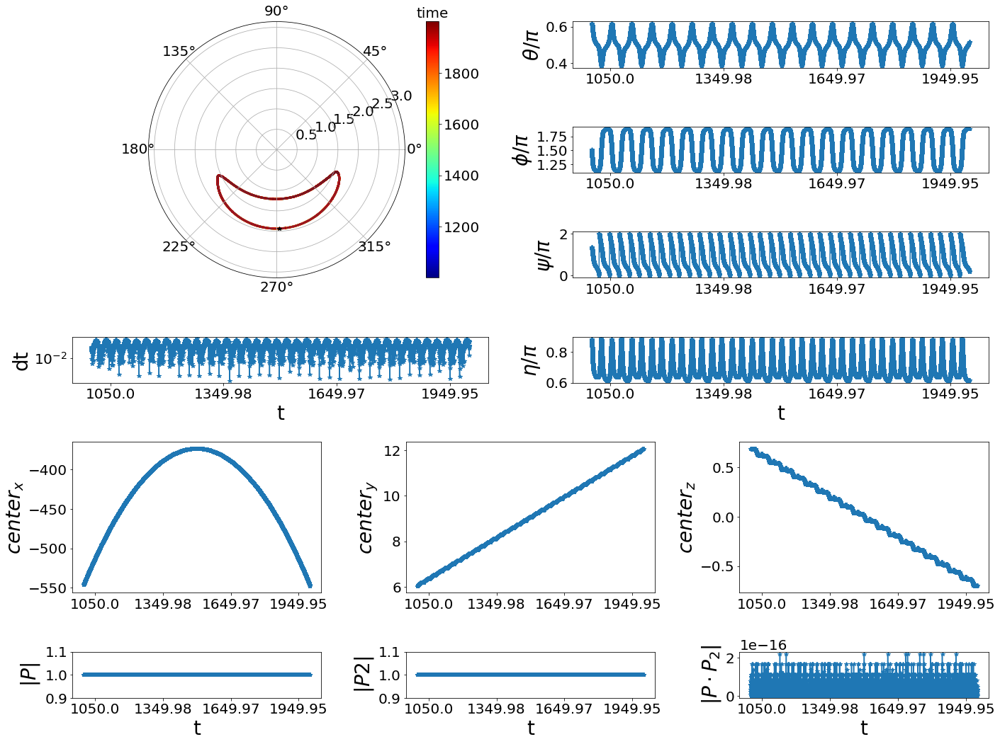

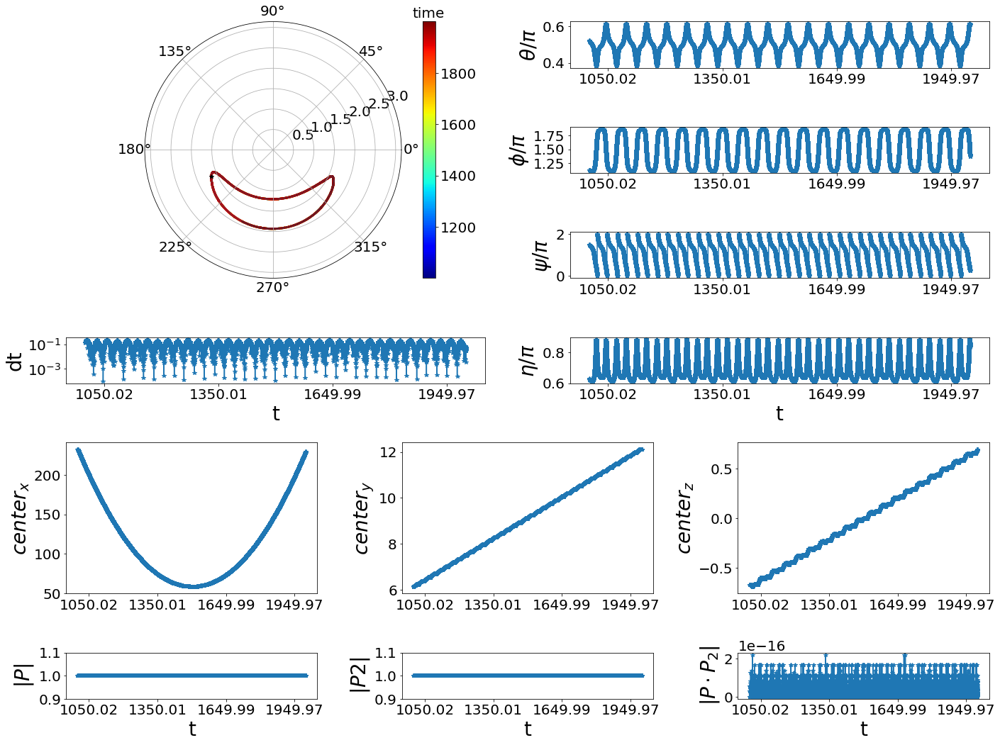

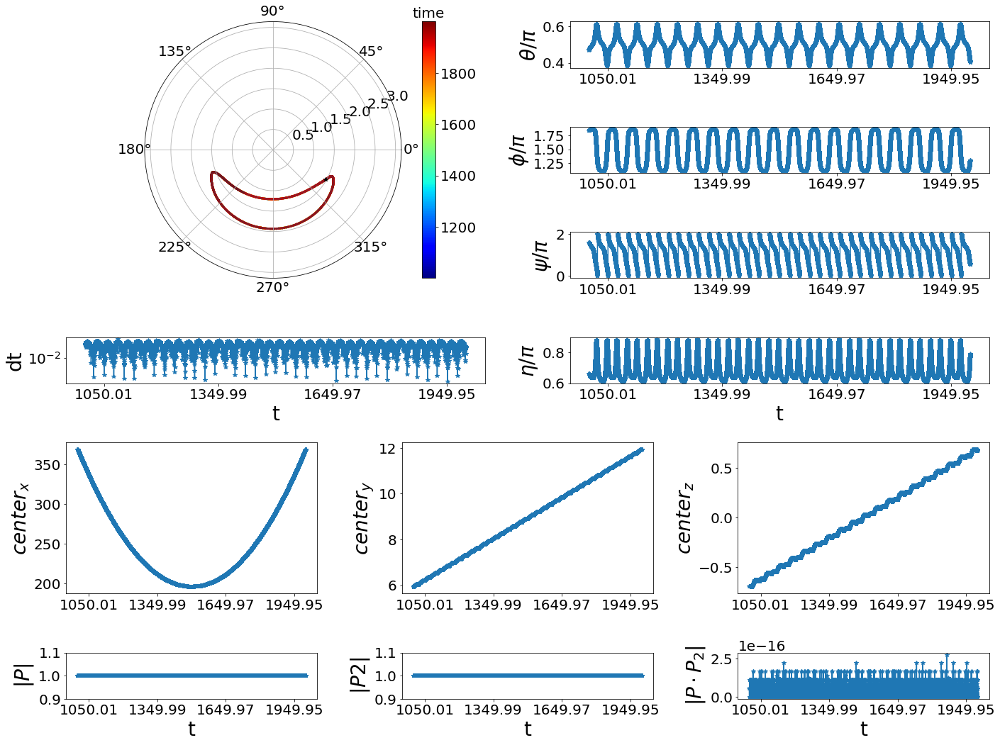

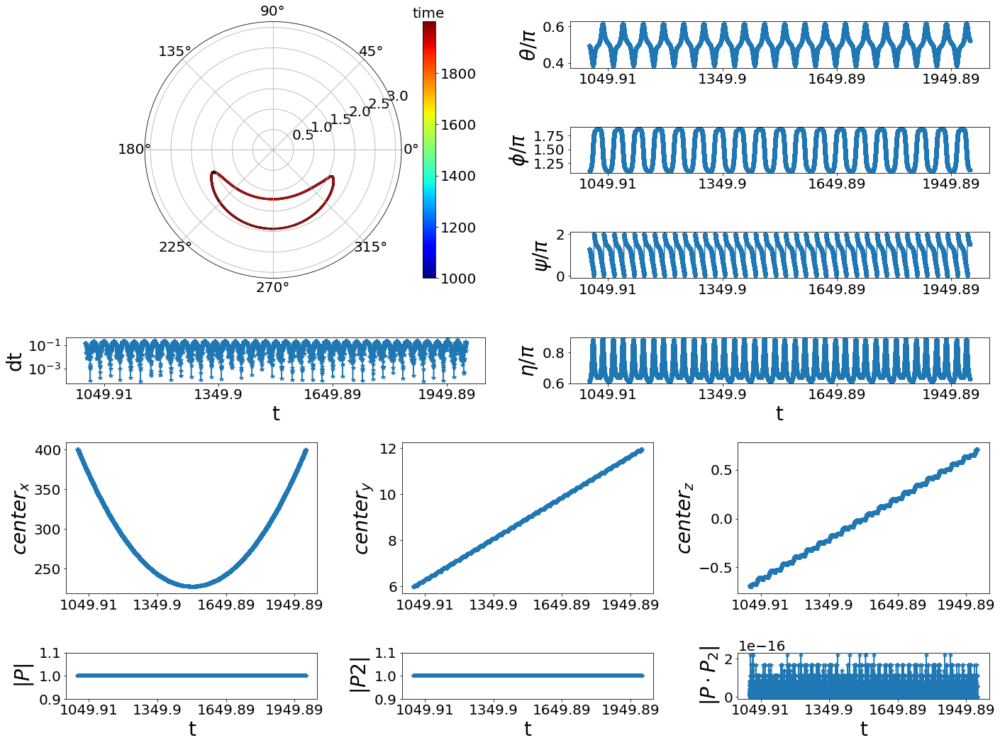

...

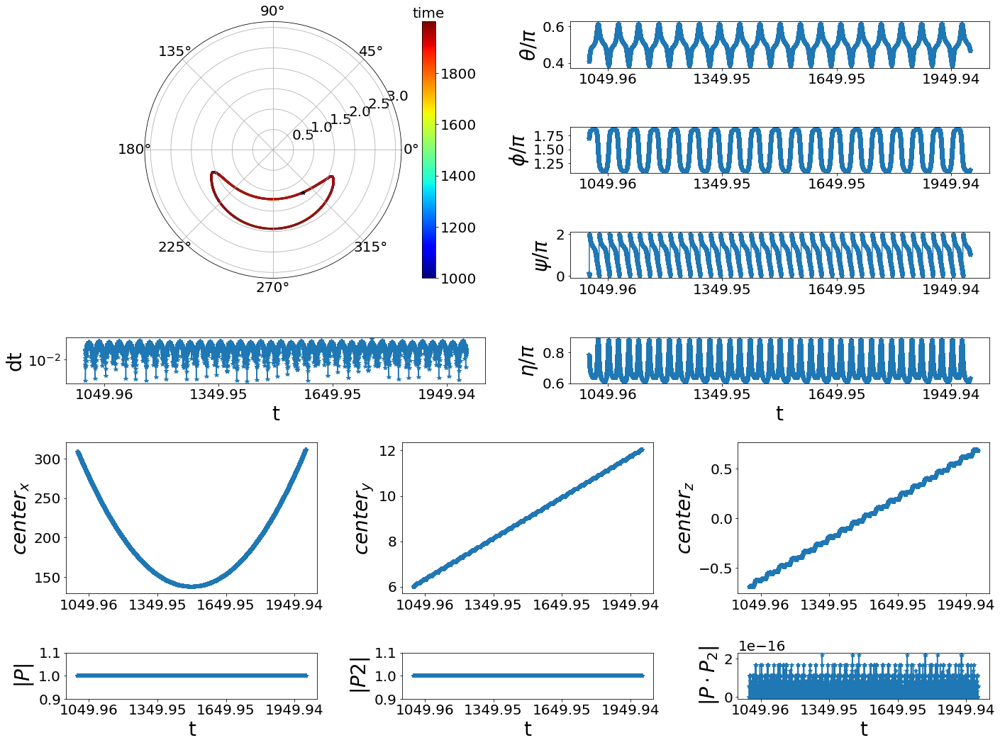

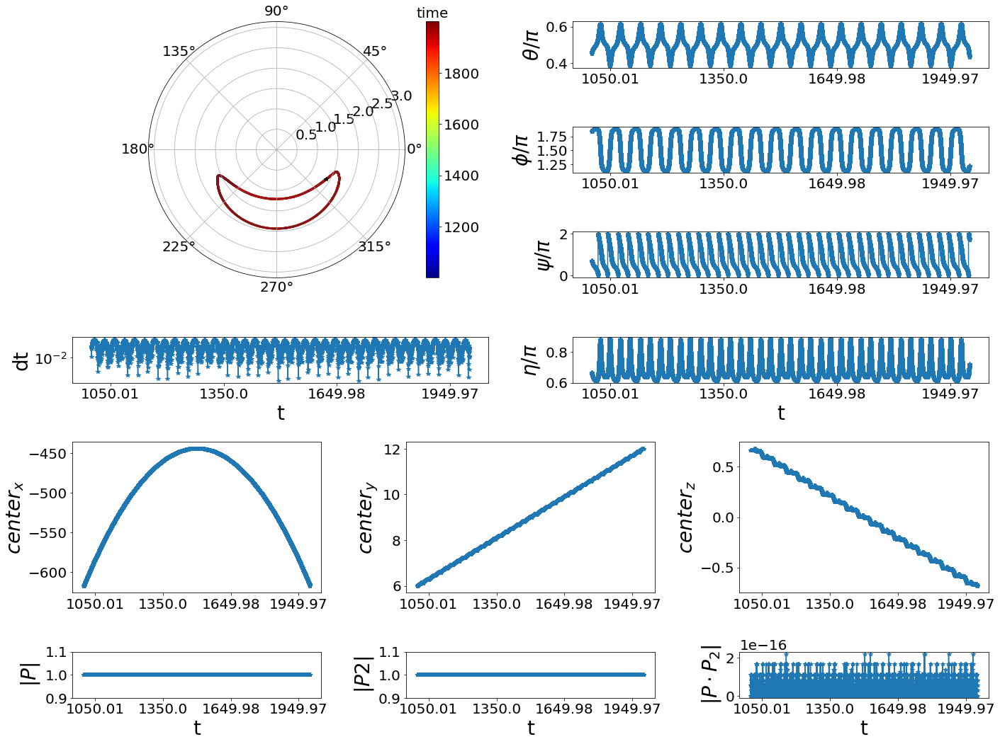

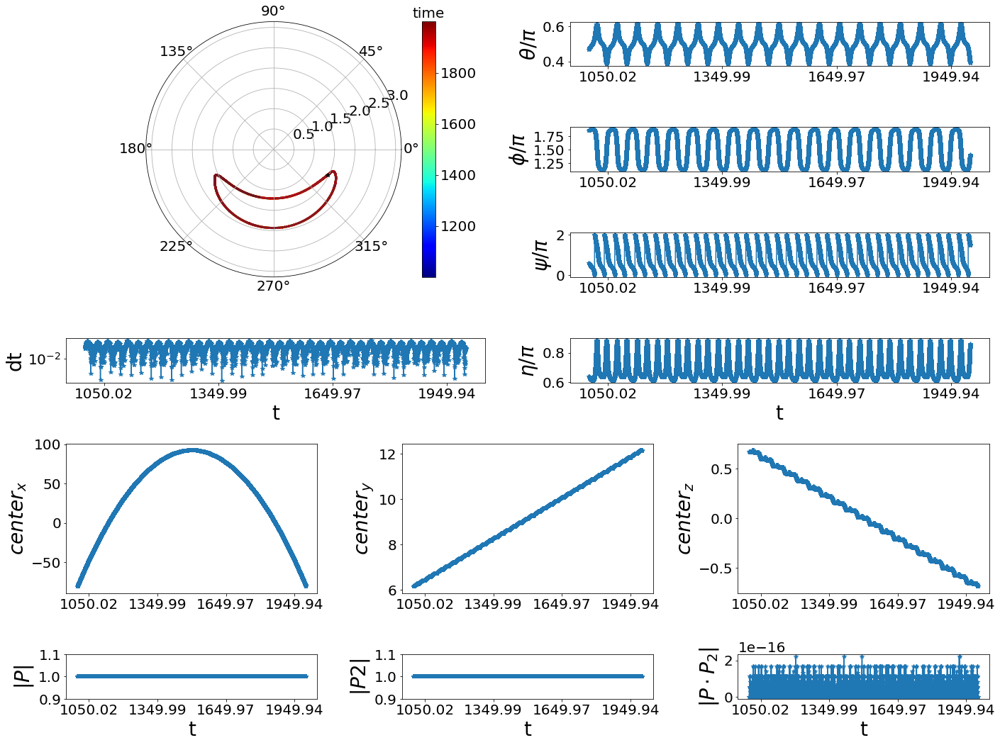

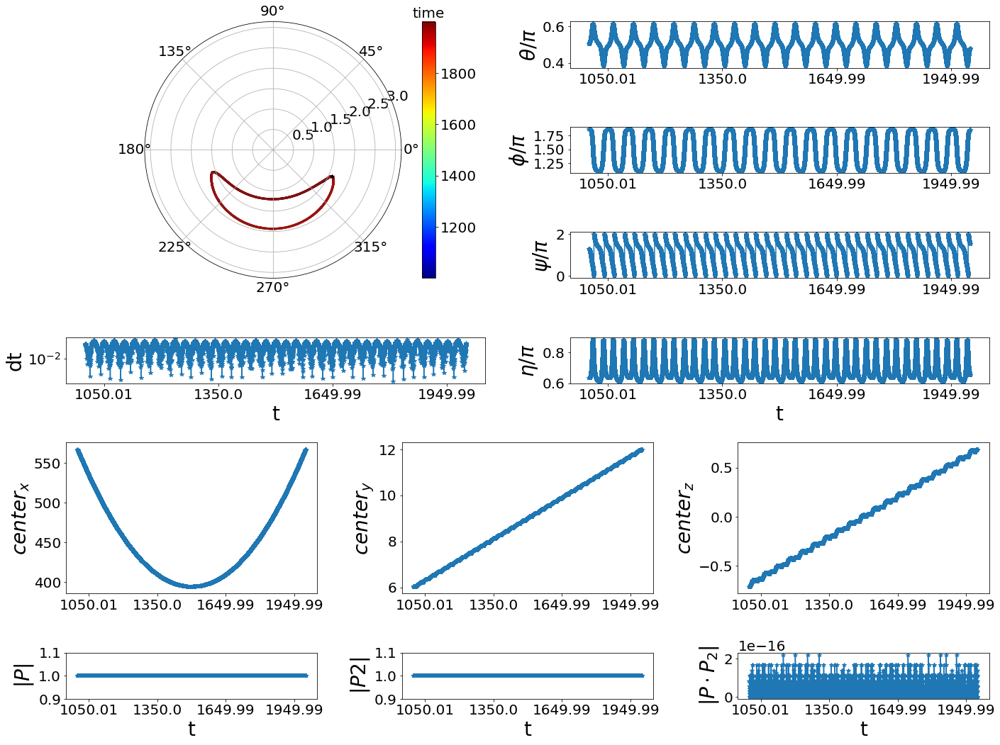

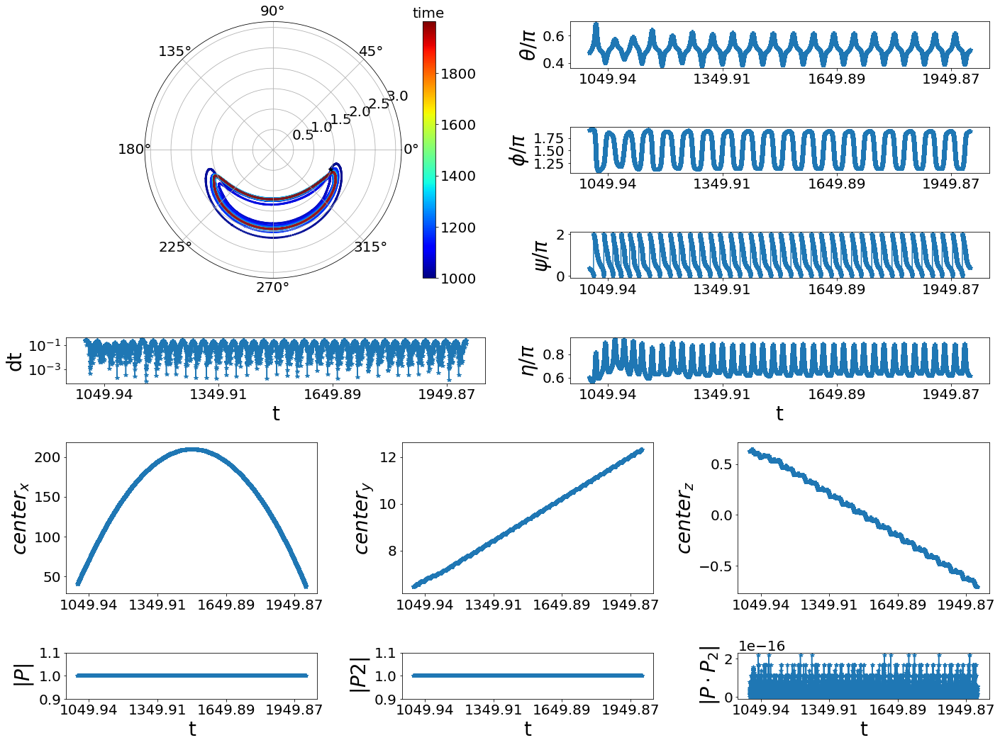

In [62]:
job_dir = 'ecoC01B05_passive_psi-0c'
tuse = data.theta_max_fre

check_fre_theta = 0.019
atol = 0.0005
show_idx_list = tuse.unstack().index.get_values().reshape(tuse.values.shape[1], tuse.values.shape[0])[np.isclose(tuse, check_fre_theta, rtol=0, atol=atol).T]
for (phi, theta) in show_idx_list[0::10]:
    t_headle = 'th%5.3f_ph%5.3f_(.*?).pickle' % (theta, phi)
    t_path = os.listdir(os.path.join(PWD, job_dir))
    filename = [filename for filename in os.listdir(os.path.join(PWD, job_dir)) 
                if re.match(t_headle, filename) is not None][0]
    with open(os.path.join(PWD, job_dir, filename), 'rb') as handle:
        tpick = pickle.load(handle)
    for var_name in tpick.keys():
        texp = '%s = tpick[\'%s\']' % (var_name, var_name)
        exec(texp)
    if 'Table_dt' not in tpick.keys():
        Table_dt = np.hstack((np.diff(Table_t), 0))
    
    t1 = np.max((0, Table_t.max() - 1000))
    idx = Table_t > t1
    tfre = spf_tb.get_major_fre(Table_t[idx], Table_theta[idx])
    print('th%5.3f_ph%5.3f, Fth=%.6f' % (theta, phi, tfre))
    spf_tb.show_table_result(Table_t[idx], Table_dt[idx], Table_X[idx], Table_P[idx], Table_P2[idx], 
                             Table_theta[idx], Table_phi[idx], Table_psi[idx], Table_eta[idx], save_every)

In [29]:
with np.printoptions(precision=6, suppress=True):
    print(np.flipud(np.sort(data.theta_max_fre.values.flatten())))

[0.064004 0.063999 0.020001 0.020001 0.020001 0.020001 0.020001 0.020001 0.020001
 0.020001 0.020001 0.020001 0.020001 0.020001 0.020001 0.020001 0.020001 0.020001
 0.020001 0.020001 0.020001 0.020001 0.020001 0.020001 0.020001 0.020001 0.020001
 0.020001 0.020001 0.02     0.02     0.02     0.02     0.02     0.02     0.02
 0.02     0.02     0.02     0.02     0.02     0.02     0.02     0.02     0.02
 0.02     0.02     0.02     0.02     0.02     0.02     0.02     0.02     0.02
 0.02     0.02     0.02     0.02     0.02     0.02     0.02     0.02     0.02
 0.02     0.02     0.02     0.02     0.02     0.02     0.02     0.02     0.02
 0.02     0.02     0.02     0.02     0.02     0.02     0.02     0.02     0.02
 0.02     0.02     0.02     0.02     0.02     0.02     0.02     0.02     0.02
 0.02     0.02     0.02     0.02     0.02     0.02     0.02     0.02     0.02
 0.02     0.02     0.02     0.02     0.02     0.02     0.02     0.02     0.02
 0.02     0.019003 0.019003 0.019003 0.019003 0.0190

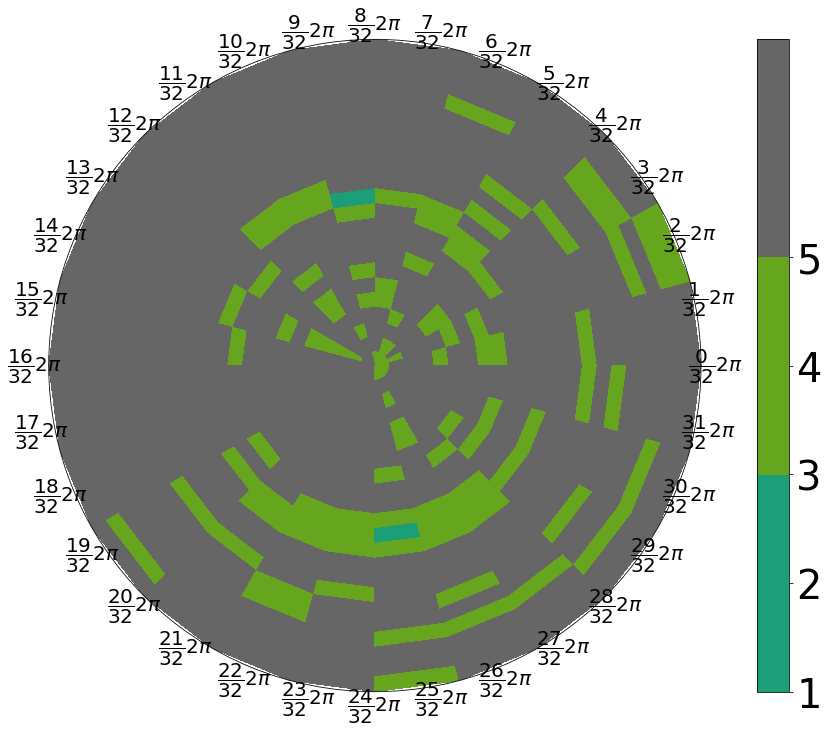

In [63]:
theta_max_fre1 = theta_max_fre.copy()
theta_max_fre1[:] = 0
# theta_max_fre1[np.isclose(theta_max_fre.values, 0.02189, rtol=0, atol=0.00001)] = 1
# theta_max_fre1[np.isclose(theta_max_fre.values, 0.05429, rtol=0, atol=0.00001)] = 2
theta_max_fre1[np.isclose(theta_max_fre.values, 0.064, rtol=0, atol=0.001)] = 1
theta_max_fre1[np.isclose(theta_max_fre.values, 0.020, rtol=0, atol=0.0002)] = 3
theta_max_fre1[np.isclose(theta_max_fre.values, 0.019, rtol=0, atol=0.0002)] = 5
theta_max_fre1[np.isclose(theta_max_fre.values, 0.016, rtol=0, atol=0.001)] = 7
theta_max_fre1[2 * np.pi] = theta_max_fre1[0]

def show_phase_map(tuse):
    fig = plt.figure(figsize=(20, 12))
    fig.patch.set_facecolor('white')
    ax0 = fig.add_subplot(111, polar=True)
    n_xticks = 32
    xticks = np.arange(n_xticks)
    ax0.set_xticks(xticks / n_xticks * 2 * np.pi)
    ax0.set_xticklabels(['$\dfrac{%d}{%d}2\pi$' % (i0, n_xticks) for i0 in xticks])
    ax0.set_yticklabels([])
    ax0.set_ylim(0, np.pi)
    im = ax0.pcolor(tuse.columns.values, tuse.index.values, tuse.values, 
                      cmap=plt.get_cmap('Dark2', 3))
    ticks = (0, 1, 2, 3, 4, 5)
    fig.colorbar(im, ticks=ticks, ax=ax0, orientation='vertical').ax.tick_params(labelsize=fontsize)
    
show_phase_map(theta_max_fre1)
# with pd.option_context("display.max_rows", 10000):
#     display(theta_max_fre1.T)

In [7]:
fig.suptitle()

array([0.     , 0.62832, 1.25664, 1.88496, 2.51327, 3.14159, 3.76991, 4.39823, 5.02655,
       5.65487])

In [4]:
# show phase map of theta-phi
import shutil

importlib.reload(spf_tb)
def tget_ax0():
    n_xticks = 32
    xticks = np.arange(n_xticks)
    fig = plt.figure(figsize=(20, 20))
    fig.patch.set_facecolor('white')
    axs = []
    axs.append(fig.add_subplot(221, polar=True))
    axs.append(fig.add_subplot(222, polar=True))
    axs.append(fig.add_subplot(223, polar=True))
    axs.append(fig.add_subplot(224, polar=True))
    for ax0 in axs:
        ax0.set_xticks(xticks / n_xticks * 2 * np.pi)
        ax0.set_xticklabels(['$\dfrac{%d}{%d}2\pi$' % (i0, n_xticks) for i0 in xticks])
        ax0.set_yticklabels([])
        ax0.set_ylim(0, np.pi)
    plt.tight_layout()
    return fig, axs

def save_phase_map_theta(job_dir, psi_lim, idx, t_min=9000):
    thandle = 'tmp_phase_map'
    fig, (ax0, ax1, ax2, ax3) = tget_ax0()
    t_headle = '(.*?).pickle'
    t_path = os.listdir(os.path.join(PWD, job_dir))
    filename_list = [filename for filename in os.listdir(os.path.join(PWD, job_dir)) 
                     if re.match(t_headle, filename) is not None]
    desc = '$%04d, %.3f\pi - %.3f\pi$' % (idx, (psi_lim[0] / np.pi), (psi_lim[1] / np.pi))
    fig.suptitle(desc, fontsize=fontsize*0.8)
    for tname in tqdm_notebook(filename_list[:], desc='%04d' % idx):
        with open(os.path.join(PWD, job_dir, tname), 'rb') as handle:
            tpick = pickle.load(handle)
        tidx = np.hstack((True, np.diff(tpick['Table_t'])>0))
        Table_t = tpick['Table_t'][tidx]
        Table_theta = tpick['Table_theta'][tidx]
        Table_phi = tpick['Table_phi'][tidx]
        Table_psi = tpick['Table_psi'][tidx]
        t_use = np.linspace(Table_t.min(), Table_t.max(), Table_t.size * 20)
        Table_theta = spf_tb.get_continue_angle(Table_t, Table_theta, t_use=t_use)
        Table_phi = spf_tb.get_continue_angle(Table_t, Table_phi, t_use=t_use)
        Table_psi = spf_tb.get_continue_angle(Table_t, Table_psi, t_use=t_use)
        Table_t = t_use
        # fft rule
        tidx = Table_t > t_min
        theta_max_fre = spf_tb.get_major_fre(Table_t[tidx], Table_theta[tidx])
        tidx = np.logical_and(Table_psi > psi_lim[0], Table_psi < psi_lim[1])
        if np.isclose(theta_max_fre, 0.022, rtol=0, atol=0.001):
            ax0.scatter(Table_phi[tidx], Table_theta[tidx], c='r', s=fontsize*0.2)
            ax1.scatter(Table_phi[tidx], Table_theta[tidx], c='r', s=fontsize*0.2)        
        elif np.isclose(theta_max_fre, 0.054, rtol=0, atol=0.001):
            ax0.scatter(Table_phi[tidx], Table_theta[tidx], c='b', s=fontsize*0.2)
            ax2.scatter(Table_phi[tidx], Table_theta[tidx], c='b', s=fontsize*0.2)
        else:
            ax0.scatter(Table_phi[tidx], Table_theta[tidx], c='k', s=fontsize*0.2)
            ax3.scatter(Table_phi[tidx], Table_theta[tidx], c='k', s=fontsize*0.2)

    # save results
    tdir = os.path.join(PWD, job_dir, thandle)
    if not os.path.exists(tdir):
        os.makedirs(tdir)
#     else:
#         shutil.rmtree(tdir)
#         os.makedirs(tdir)
    figname = '%04d.png' % (idx)
    fig.savefig(os.path.join(tdir, figname))
    plt.close(ax0.figure)

job_dir = 'hlxC01_a_psi-0b'
n_psi_lim = 20
for idx, psi_lim1 in enumerate(np.linspace(0, 2 * np.pi, n_psi_lim * 16, endpoint=False)[::n_psi_lim]):
    psi_lim = (psi_lim1, psi_lim1 + 2 * np.pi / (n_psi_lim * 16))
    save_phase_map_theta(job_dir, psi_lim, idx, t_min=9000)
print('finish')

/home/zhangji/stokes_flow_master/codeStore/support_fun_table.py:12: UserWarning: matplotlib.pyplot as already been imported, this call will have no effect.
  matplotlib.use('agg')


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [5]:
np.linspace(0, 2 * np.pi, n_psi_lim * 16, endpoint=False)[::n_psi_lim]

array([0.     , 0.3927 , 0.7854 , 1.1781 , 1.5708 , 1.9635 , 2.35619, 2.74889, 3.14159,
       3.53429, 3.92699, 4.31969, 4.71239, 5.10509, 5.49779, 5.89049])

/home/zhangji/stokes_flow_master/codeStore/support_fun_table.py:12: UserWarning: matplotlib.pyplot as already been imported, this call will have no effect.
  matplotlib.use('agg')


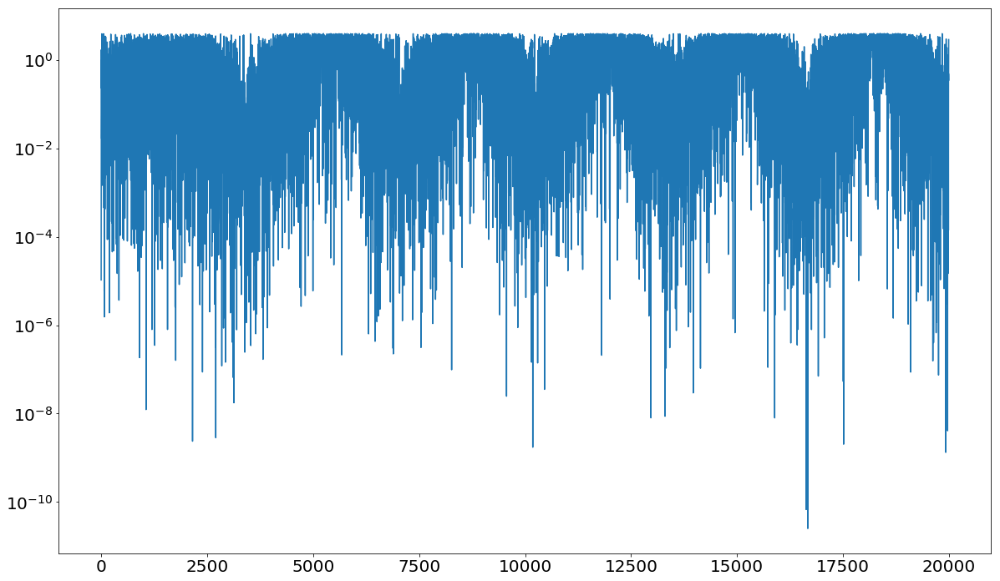

In [438]:
importlib.reload(spf_tb)

# job_dir = 'hlxC01_a_psi-0b'
# theta, phi = 0.000, 0.000
# tpick1, _ = spf_tb.load_table_date_pickle(job_dir, theta, phi)
# theta, phi = 0.000, 0.063
# tpick2, _ = spf_tb.load_table_date_pickle(job_dir, theta, phi)

# job_dir = 'hlxC01_a_psi-0b'
# theta, phi = 0.349, 6.125
# tpick1, _ = spf_tb.load_table_date_pickle(job_dir, theta, phi)
# theta, phi = 0.349, 6.188
# tpick2, _ = spf_tb.load_table_date_pickle(job_dir, theta, phi)

job_dir = 'hlxC01_a_psi-0d'
theta, phi = 3.142, 0.214
tpick1, _ = spf_tb.load_table_date_pickle(job_dir, theta, phi)
theta, phi = 3.142, 0.198
tpick2, _ = spf_tb.load_table_date_pickle(job_dir, theta, phi)

t1 = np.max((tpick1['Table_t'].min(), tpick2['Table_t'].min()))
t2 = np.min((tpick1['Table_t'].max(), tpick2['Table_t'].max()))
t_use = np.linspace(t1, t2, tpick1['Table_t'].size + tpick1['Table_t'].size)
phi1 = spf_tb.get_continue_angle(tpick1['Table_t'], tpick1['Table_phi'], t_use=t_use)
phi2 = spf_tb.get_continue_angle(tpick2['Table_t'], tpick2['Table_phi'], t_use=t_use)
delta_cos2psi = (np.cos(phi1) - np.cos(phi2)) ** 2

fig = plt.figure(figsize=(20, 12))
fig.patch.set_facecolor('white')
ax0 = fig.add_subplot(111)
ax0.semilogy(t_use, delta_cos2psi)